In [148]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [149]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from fastai.imports import *
from fastai.structured import *

from sklearn.ensemble import RandomForestRegressor

In [150]:
def print_score(model):
    scores = [model.score(X_train, y_train), model.score(X_valid, y_valid),
#                   model.predict(X_train), model.predict(X_valid)
             ]
    return scores

In [151]:
PATH = '../datafiles'

#this function loads and parse the data.csv file
def load_housing_data(file_name):
    csv_file_path = os.path.join(PATH, file_name)
    return pd.read_csv(csv_file_path)

housing = load_housing_data('housing.csv')

In [152]:
pd.set_option('display.max_column', len(housing))

In [153]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [154]:
housing[1:21].transpose()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20
longitude,-122.22,-122.24,-122.25,-122.25,-122.25,-122.25,-122.25,-122.26,-122.25,-122.26,-122.26,-122.26,-122.26,-122.26,-122.26,-122.27,-122.27,-122.26,-122.27,-122.27
latitude,37.86,37.85,37.85,37.85,37.85,37.84,37.84,37.84,37.84,37.85,37.85,37.85,37.84,37.85,37.85,37.85,37.85,37.84,37.84,37.85
housing_median_age,21,52,52,52,52,52,52,42,52,52,52,52,52,52,50,52,52,50,52,40
total_rooms,7099,1467,1274,1627,919,2535,3104,2555,3549,2202,3503,2491,696,2643,1120,1966,1228,2239,1503,751
total_bedrooms,1106,190,235,280,213,489,687,665,707,434,752,474,191,626,283,347,293,455,298,184
population,2401,496,558,565,413,1094,1157,1206,1551,910,1504,1098,345,1212,697,793,648,990,690,409
households,1138,177,219,259,193,514,647,595,714,402,734,468,174,620,264,331,303,419,275,166
median_income,8.3014,7.2574,5.6431,3.8462,4.0368,3.6591,3.12,2.0804,3.6912,3.2031,3.2705,3.075,2.6736,1.9167,2.125,2.775,2.1202,1.9911,2.6033,1.3578
median_house_value,358500,352100,341300,342200,269700,299200,241400,226700,261100,281500,241800,213500,191300,159200,140000,152500,155500,158700,162900,147500
ocean_proximity,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY,NEAR BAY


In [155]:
train_cats(housing)
train_df, train_y, nas = proc_df(housing, 'median_house_value')
train_df.transpose()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

In [156]:
train_df.dtypes

longitude             float64
latitude              float64
housing_median_age    float64
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
ocean_proximity          int8
total_bedrooms_na        bool
dtype: object

In [157]:
train_df.isnull().sum()
#no missing values

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
ocean_proximity       0
total_bedrooms_na     0
dtype: int64

In [158]:
X_train, X_valid = train_df[:12000], train_df[12000:]
y_train, y_valid = train_y[:12000], train_y[12000:]
X_valid.shape, X_train.shape, y_train.shape, y_valid.shape

((8640, 10), (12000, 10), (12000,), (8640,))

In [159]:
model = RandomForestRegressor().fit(X_train, y_train)
print_score(model)

[0.9783672937874789, 0.5658304352415371]

In [160]:
model =RandomForestRegressor(n_estimators=100, max_depth=100, max_features=0.5, min_samples_leaf=1, n_jobs=-1)
model.fit(X_train, y_train)
print_score(model)

[0.9784369103207187, 0.6286403432784275]

In [161]:
fi = rf_feat_importance(model, train_df)
fi

,cols,imp
7,median_income,0.455663
1,latitude,0.179445
0,longitude,0.164004
8,ocean_proximity,0.040038
5,population,0.038549
2,housing_median_age,0.038200
3,total_rooms,0.034770
4,total_bedrooms,0.025232
6,households,0.023880
9,total_bedrooms_na,0.000219


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb4dd9bd160>]],
      dtype=object)

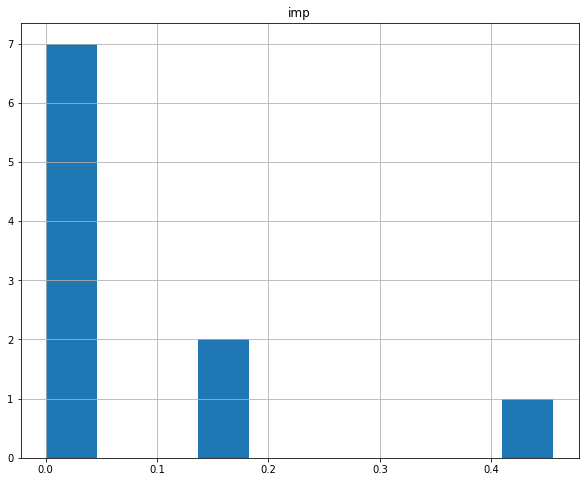

In [162]:
fi.hist(figsize=(10,8))

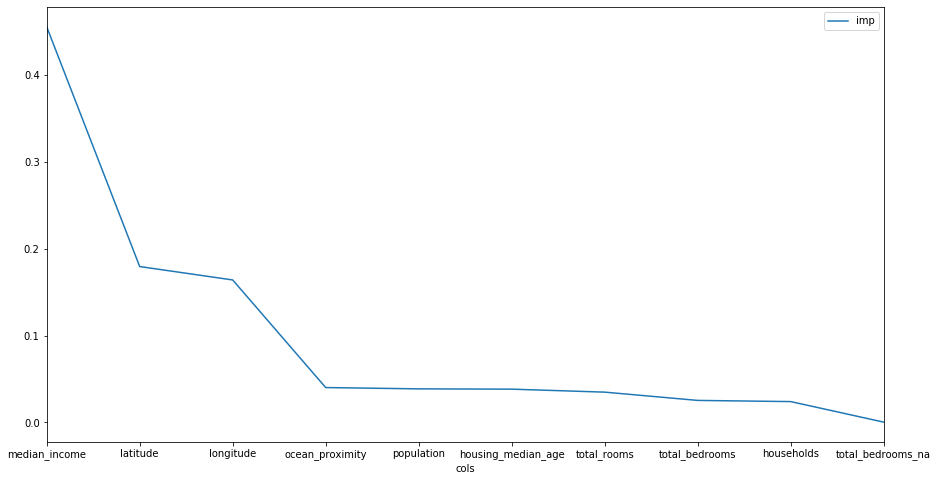

In [163]:
fi.plot('cols', 'imp', figsize=(15, 8))

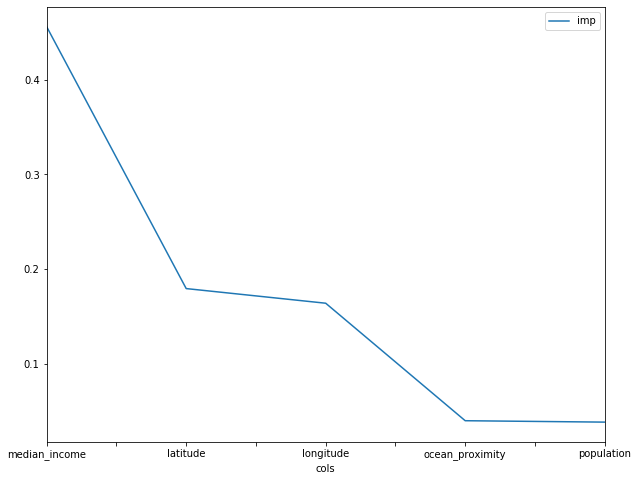

In [164]:
#plot of the top 5 important features
fi[:5].plot('cols', 'imp', figsize=(10, 8))

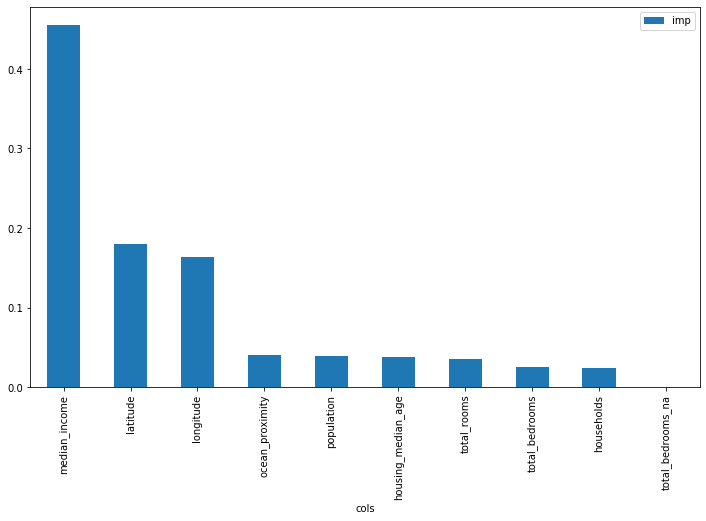

In [165]:
fi.plot('cols', 'imp', 'bar', figsize=(12, 7), legend=True)